### Settings

In [2]:
from fsr_predictor import get_best_prediction
from fsr_plot import plot_list, plot_force, plot_coord, plot_cop
TASK1 = 'FSR_Trainable_2023-08-10_18-18-32'
TASK2 = 'FSR_Trainable_2023-07-19_01-25-28'
TASK3 = 'FSR_Trainable_2023-07-19_03-37-48'
TASK4 = 'FSR_Trainable_2023-08-10_23-25-39'
TASK5 = 'FSR_Trainable_2023-07-19_10-04-48'
TASK6 = 'FSR_Trainable_2023-07-19_12-32-34'
EPS = 0.01

In [3]:
from fsr_data import get_file_data
get_file_data().loc[62:62]

,subject,pose,filename,path
62,6,gait10,GAIT10-2.pickle,/home/seokj/workspace/FSR-prediction/data/6/ga...


In [4]:
from fsr_data import get_index_splited_by_time, get_index_splited_by_subject
import pandas as pd
data, train, test = get_index_splited_by_subject()
data.loc[test[10]]

Category  id time force                              x_coord      ...  \
Position              A    B    C      D    E      F       A   B  ...   
45578     62    0   0.0  0.0  0.0   26.0  0.0    0.0     NaN NaN  ...   
45579     62    1   0.0  0.0  0.0  249.0  0.0    0.0     NaN NaN  ...   
45580     62    2   0.0  0.0  0.0  405.0  0.0    0.0     NaN NaN  ...   
45581     62    3   0.0  0.0  0.0  511.0  0.0    0.0     NaN NaN  ...   
45582     62    4   0.0  0.0  0.0  622.0  0.0    0.0     NaN NaN  ...   
...       ..  ...   ...  ...  ...    ...  ...    ...     ...  ..  ...   
46039     62  461   0.0  0.0  0.0    0.0  0.0   55.0     NaN NaN  ...   
46040     62  462   0.0  0.0  0.0    0.0  0.0    0.0     NaN NaN  ...   
46041     62  463   0.0  0.0  0.0    0.0  0.0    0.0     NaN NaN  ...   
46042     62  464   0.0  0.0  0.0    0.0  0.0  109.0     NaN NaN  ...   
46043     62  465   0.0  0.0  0.0    0.0  0.0   10.0     NaN NaN  ...   

Category FSR_for_force                  FSR_for_coord                      \
Position             C      D    E    F             A    B    C         D   
45578              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   
45579              0.0   64.0  0.0  0.0           0.0  0.0  0.0  1.015873   
45580              0.0   76.0  0.0  0.0           0.0  0.0  0.0  1.206349   
45581              0.0   97.0  0.0  0.0           0.0  0.0  0.0  1.539683   
45582              0.0  123.0  0.0  0.0           0.0  0.0  0.0  1.952381   
...                ...    ...  ...  ...           ...  ...  ...       ...   
46039              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   
46040              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   
46041              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   
46042              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   
46043              0.0    0.0  0.0  0.0           0.0  0.0  0.0  0.000000   

Category            
Position    E    F  
45578     0.0  0.0  
45579     0.0  0.0  
45580     0.0  0.0  
45581     0.0  0.0  
45582     0.0  0.0  
...       ...  ...  
46039     0.0  0.0  
46040     0.0  0.0  
46041     0.0  0.0  
46042     0.0  0.0  
46043     0.0  0.0  

[466 rows x 32 columns]

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

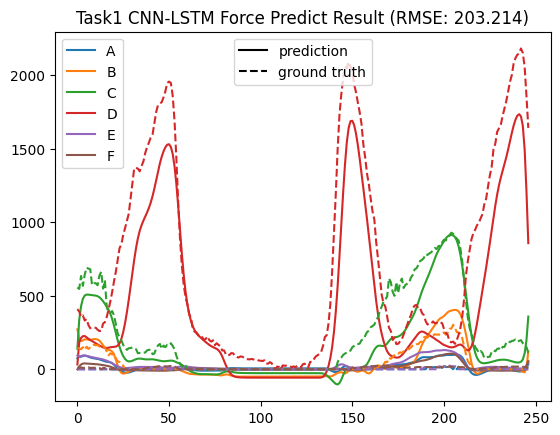

In [9]:
results = get_best_prediction('FSR_Trainable_2023-08-10_16-28-50', 'metric', 'min')
data = results[19]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(pred[:, i], label='ABCDEF'[i])
handles = ax.get_legend_handles_labels()[0]
for i in range(6):
    ax.plot(y[:, i], label='ABCDEF'[i], c=handles[i].get_color(), linestyle='--')
from matplotlib.lines import Line2D
legend = plt.legend(handles, list('ABCDEF'), loc='upper left')
ax.legend([Line2D([], [], color='black'), Line2D([], [], linestyle='--', color='black')], ['prediction', 'ground truth'], loc='upper center')
ax.add_artist(legend)
ax.set_title('Task1 CNN-LSTM Force Predict Result (RMSE: 203.214)')
plt.savefig('./plot2-2', transparent=True)

Failed to read the results for 2 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_1a76a8a6_33_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-35-52
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_3d8c1dc7_11_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-20-39
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated a

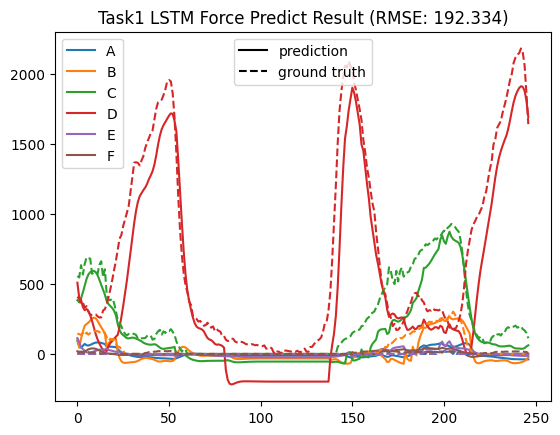

In [10]:
results = get_best_prediction(TASK1, 'metric', 'min')
data = results[19]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(pred[:, i], label='ABCDEF'[i])
handles = ax.get_legend_handles_labels()[0]
for i in range(6):
    ax.plot(y[:, i], label='ABCDEF'[i], c=handles[i].get_color(), linestyle='--')
from matplotlib.lines import Line2D
legend = plt.legend(handles, list('ABCDEF'), loc='upper left')
ax.legend([Line2D([], [], color='black'), Line2D([], [], linestyle='--', color='black')], ['prediction', 'ground truth'], loc='upper center')
ax.add_artist(legend)
ax.set_title('Task1 LSTM Force Predict Result (RMSE: 192.334)')
plt.savefig('./plot2', transparent=True)

In [17]:
import numpy as np
np.clip([3, 2, 1], 2, float('inf'))

array([3., 2., 2.])

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

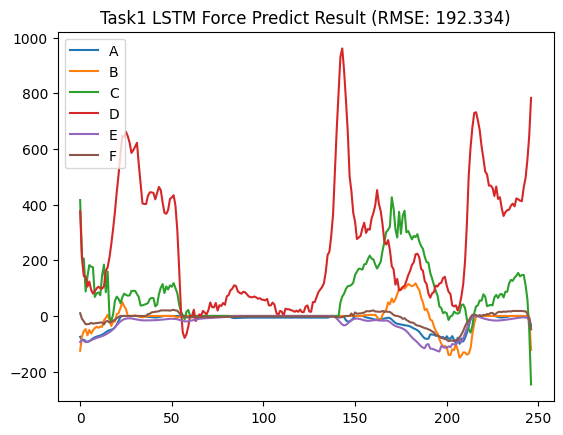

In [22]:
results = get_best_prediction('FSR_Trainable_2023-08-10_16-28-50', 'metric', 'min')
data = results[19]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(y[:, i] - np.clip(pred[:, i], 0, float('inf')), label='ABCDEF'[i])
# plt.legend(handles, list('ABCDEF'), loc='upper left')
plt.legend('ABCDEF', loc='upper left')
ax.set_title('Task1 LSTM Force Predict Result (RMSE: 192.334)')
plt.savefig('./plot2-2-diff', transparent=True)

Failed to read the results for 2 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_1a76a8a6_33_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-35-52
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_3d8c1dc7_11_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-20-39
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated a

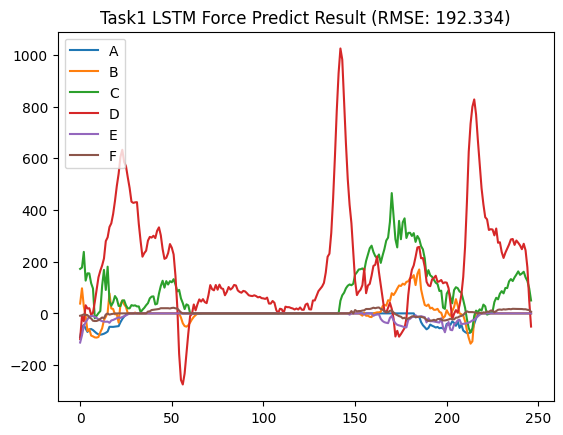

In [21]:
results = get_best_prediction(TASK1, 'metric', 'min')
data = results[19]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(y[:, i] - np.clip(pred[:, i], 0, float('inf')), label='ABCDEF'[i])
# plt.legend(handles, list('ABCDEF'), loc='upper left')
plt.legend('ABCDEF', loc='upper left')
ax.set_title('Task1 LSTM Force Predict Result (RMSE: 192.334)')
plt.savefig('./plot2-diff', transparent=True)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

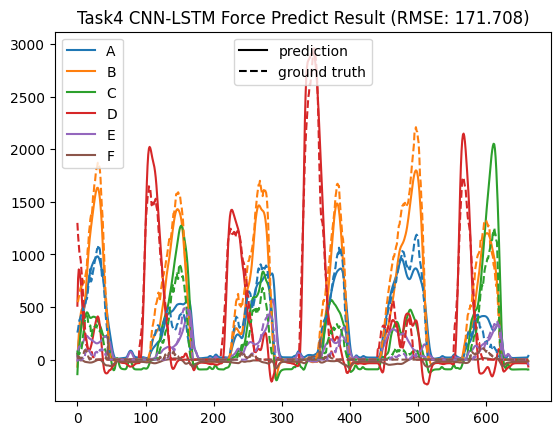

In [28]:
results = get_best_prediction('FSR_Trainable_2023-08-10_23-25-39', 'metric', 'min')
data = results[3]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(pred[:, i], label='ABCDEF'[i])
handles = ax.get_legend_handles_labels()[0]
for i in range(6):
    ax.plot(y[:, i], label='ABCDEF'[i], c=handles[i].get_color(), linestyle='--')
from matplotlib.lines import Line2D
legend = plt.legend(handles, list('ABCDEF'), loc='upper left')
ax.legend([Line2D([], [], color='black'), Line2D([], [], linestyle='--', color='black')], ['prediction', 'ground truth'], loc='upper center')
ax.add_artist(legend)
ax.set_title('Task4 CNN-LSTM Force Predict Result (RMSE: 171.708)')
plt.savefig('./plot9', transparent=True)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

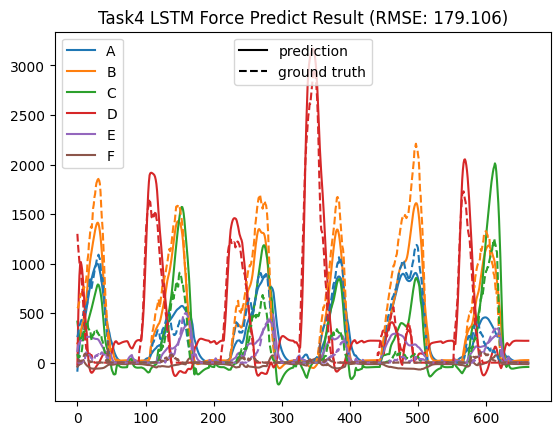

In [30]:
results = get_best_prediction('FSR_Trainable_2023-08-11_00-39-35', 'metric', 'min')
data = results[3]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(pred[:, i], label='ABCDEF'[i])
handles = ax.get_legend_handles_labels()[0]
for i in range(6):
    ax.plot(y[:, i], label='ABCDEF'[i], c=handles[i].get_color(), linestyle='--')
from matplotlib.lines import Line2D
legend = plt.legend(handles, list('ABCDEF'), loc='upper left')
ax.legend([Line2D([], [], color='black'), Line2D([], [], linestyle='--', color='black')], ['prediction', 'ground truth'], loc='upper center')
ax.add_artist(legend)
ax.set_title('Task4 LSTM Force Predict Result (RMSE: 179.106)')
plt.savefig('./plot9-2', transparent=True)

In [ ]:
results = get_best_prediction(TASK2, 'rmse', 'min')
data = results[19]
import matplotlib.pyplot as plt
ax = plt.subplot()
pred, y = data
for i in range(6):
    ax.plot(pred[:, i], label='ABCDEF'[i])
handles = ax.get_legend_handles_labels()[0]
for i in range(6):
    ax.plot(y[:, i], label='ABCDEF'[i], c=handles[i].get_color(), linestyle='--')
from matplotlib.lines import Line2D
legend = plt.legend(handles, list('ABCDEF'), loc='upper left')
ax.legend([Line2D([], [], color='black'), Line2D([], [], linestyle='--', color='black')], ['prediction', 'ground truth'], loc='upper center')
ax.add_artist(legend)
ax.set_title('Task1 LSTM Force Predict Result (RMSE: 97.267)')
plt.savefig('./plot1', transparent=True)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

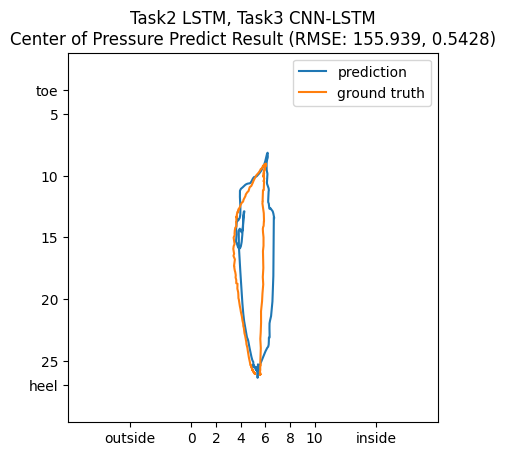

In [31]:
results1 = get_best_prediction('FSR_Trainable_2023-07-19_01-25-28', 'rmse', 'min')
results2 = get_best_prediction('FSR_Trainable_2023-07-19_03-37-48', 'rmse', 'min')
data1 = results1[26]
data2 = results2[26]
import numpy as np
data = [(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)]
data = data[26]
# for pred, y in results1:
#     pred[:, :6][pred[:, :6] < EPS] = 0
#     y[:, :6][y[:, :6] < EPS] = 0
# for pred, y in results2:
#     pred[:, :6][pred[:, :6] < EPS] = 0
#     y[:, :6][y[:, :6] < EPS] = 0
ax = plt.subplot()
pred, y = data
ax.set_xlim(-10, 20)
ax.set_ylim(30, 0)
ax.set_aspect('equal')
ax.set_xticks([-5, 0, 2, 4, 6, 8, 10, 15], labels=['outside', 0, 2, 4, 6, 8, 10, 'inside'])
ax.set_yticks([3, 5, 10, 15, 20, 25, 27], labels=['toe', 5, 10, 15, 20, 25, 'heel'])
cop_x = (pred[:, :6] * pred[:, 6:12]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_y = (pred[:, :6] * pred[:, 12:]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_x = cop_x[(pred[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(pred[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
cop_x = (y[:, :6] * y[:, 6:12]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_y = (y[:, :6] * y[:, 12:]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_x = cop_x[(y[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(y[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
ax.legend(['prediction', 'ground truth'])
ax.set_title('Task2 LSTM, Task3 CNN-LSTM\nCenter of Pressure Predict Result (RMSE: 155.939, 0.5428)')
plt.savefig('./plot3', transparent=True)
# plot_list(, plot_cop)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

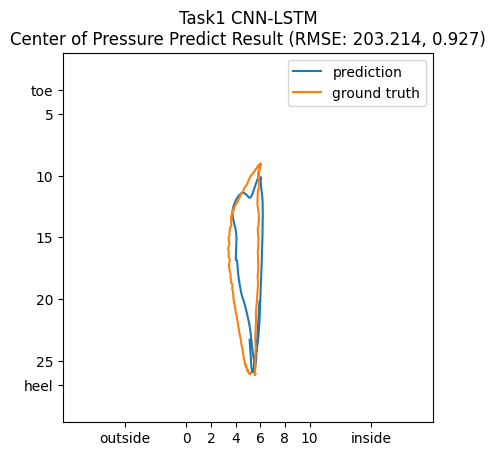

In [37]:
results1 = get_best_prediction('FSR_Trainable_2023-08-10_16-28-50', 'metric', 'min')
results2 = get_best_prediction('FSR_Trainable_2023-08-10_16-28-50', 'metric', 'min')
data1 = results1[26]
data2 = results2[26]
import numpy as np
data = [(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)]
data = data[26]
# for pred, y in results1:
#     pred[:, :6][pred[:, :6] < EPS] = 0
#     y[:, :6][y[:, :6] < EPS] = 0
# for pred, y in results2:
#     pred[:, :6][pred[:, :6] < EPS] = 0
#     y[:, :6][y[:, :6] < EPS] = 0
ax = plt.subplot()
pred, y = data
ax.set_xlim(-10, 20)
ax.set_ylim(30, 0)
ax.set_aspect('equal')
ax.set_xticks([-5, 0, 2, 4, 6, 8, 10, 15], labels=['outside', 0, 2, 4, 6, 8, 10, 'inside'])
ax.set_yticks([3, 5, 10, 15, 20, 25, 27], labels=['toe', 5, 10, 15, 20, 25, 'heel'])
cop_x = (pred[:, :6] * pred[:, 24:30]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_y = (pred[:, :6] * pred[:, 30:]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_x = cop_x[(pred[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(pred[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
cop_x = (y[:, :6] * y[:, 24:30]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_y = (y[:, :6] * y[:, 30:]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_x = cop_x[(y[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(y[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
ax.legend(['prediction', 'ground truth'])
ax.set_title('Task1 CNN-LSTM\nCenter of Pressure Predict Result (RMSE: 203.214, 0.927)')
plt.savefig('./plot3-2', transparent=True)
# plot_list(, plot_cop)

Failed to read the results for 1 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-07-19_10-04-48/FSR_Trainable_2a147f32_9_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_subject,index_X=FSR_for_force,index__2023-07-19_10-08-30
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.jso

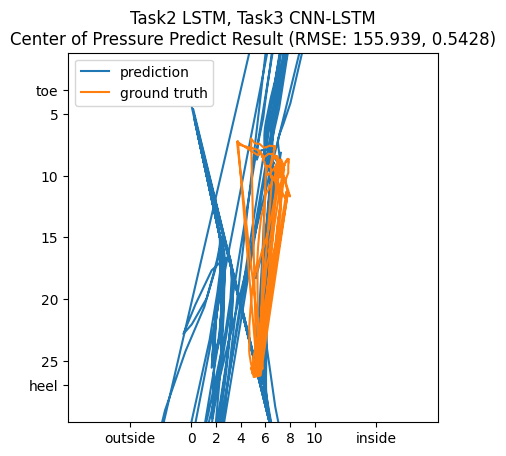

In [49]:
results1 = get_best_prediction('FSR_Trainable_2023-07-19_10-04-48', 'rmse', 'min')
results2 = get_best_prediction('FSR_Trainable_2023-07-19_12-32-34', 'rmse', 'min')
data1 = results1[1]
data2 = results2[1]
import numpy as np
data = [(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)]
data = data[1]
for pred, y in results1:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
for pred, y in results2:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
ax = plt.subplot()
pred, y = data
ax.set_xlim(-10, 20)
ax.set_ylim(30, 0)
ax.set_aspect('equal')
ax.set_xticks([-5, 0, 2, 4, 6, 8, 10, 15], labels=['outside', 0, 2, 4, 6, 8, 10, 'inside'])
ax.set_yticks([3, 5, 10, 15, 20, 25, 27], labels=['toe', 5, 10, 15, 20, 25, 'heel'])
cop_x = ((pred[:, :6] * pred[:, 6:12]).sum(axis=1)) / (pred[:, :6].sum(axis=1))
cop_y = ((pred[:, :6] * pred[:, 12:]).sum(axis=1) ) / (pred[:, :6].sum(axis=1))
cop_x = cop_x[(pred[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(pred[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
cop_x = (y[:, :6] * y[:, 6:12]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_y = (y[:, :6] * y[:, 12:]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_x = cop_x[(y[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(y[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
ax.legend(['prediction', 'ground truth'])
ax.set_title('Task2 LSTM, Task3 CNN-LSTM\nCenter of Pressure Predict Result (RMSE: 155.939, 0.5428)')
plt.savefig('./plot3', transparent=True)
# plot_list(, plot_cop)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

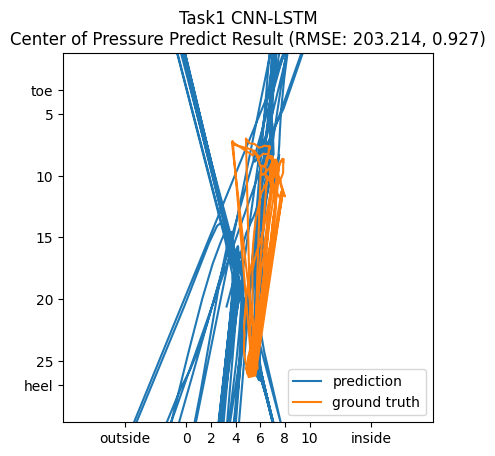

In [53]:
results1 = get_best_prediction('FSR_Trainable_2023-08-10_23-25-39', 'metric', 'min')
results2 = get_best_prediction('FSR_Trainable_2023-08-10_23-25-39', 'metric', 'min')
data1 = results1[1]
data2 = results2[1]
import numpy as np
data = [(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)]
data = data[1]
for pred, y in results1:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
for pred, y in results2:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0

ax = plt.subplot()
pred, y = data
ax.set_xlim(-10, 20)
ax.set_ylim(30, 0)
ax.set_aspect('equal')
ax.set_xticks([-5, 0, 2, 4, 6, 8, 10, 15], labels=['outside', 0, 2, 4, 6, 8, 10, 'inside'])
ax.set_yticks([3, 5, 10, 15, 20, 25, 27], labels=['toe', 5, 10, 15, 20, 25, 'heel'])
cop_x = (pred[:, :6] * pred[:, 24:30]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_y = (pred[:, :6] * pred[:, 30:]).sum(axis=1)/pred[:, :6].sum(axis=1)
cop_x = cop_x[(pred[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(pred[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
cop_x = (y[:, :6] * y[:, 24:30]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_y = (y[:, :6] * y[:, 30:]).sum(axis=1)/y[:, :6].sum(axis=1)
cop_x = cop_x[(y[:, :6] != 0).any(axis=1)]
cop_y = cop_y[(y[:, :6] != 0).any(axis=1)]
ax.plot(cop_x, cop_y)
ax.legend(['prediction', 'ground truth'])
ax.set_title('Task1 CNN-LSTM\nCenter of Pressure Predict Result (RMSE: 203.214, 0.927)')
plt.savefig('./plot3-2', transparent=True)

# plot_list(, plot_cop)

# force plot

### task1

Failed to read the results for 2 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_1a76a8a6_33_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-35-52
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_3d8c1dc7_11_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-20-39
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated a

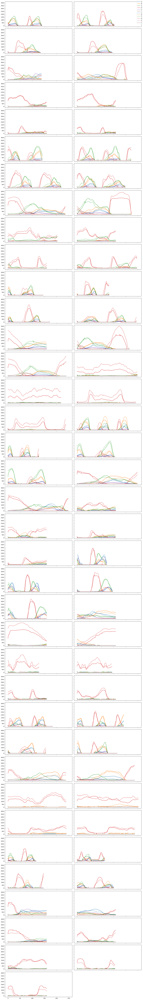

In [3]:
results = get_best_prediction(TASK1, 'metric', 'min')
for pred, y in results:
    pred[pred < EPS] = 0
    y[y < EPS] = 0
plot_list([(pred[:, :6], y[:, :6]) for pred, y in results], plot_force, axis_size=(8, 3), max_col=2)

### task2

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

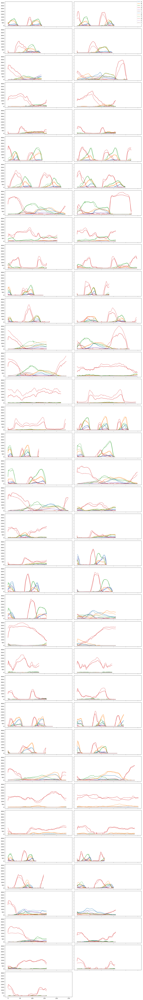

In [26]:
results = get_best_prediction(TASK2, 'rmse', 'min')
for pred, y in results:
    pred[pred < EPS] = 0
    y[y < EPS] = 0
plot_list([(pred, y) for pred, y in results], plot_force, axis_size=(8, 3), max_col=2)

### task4

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

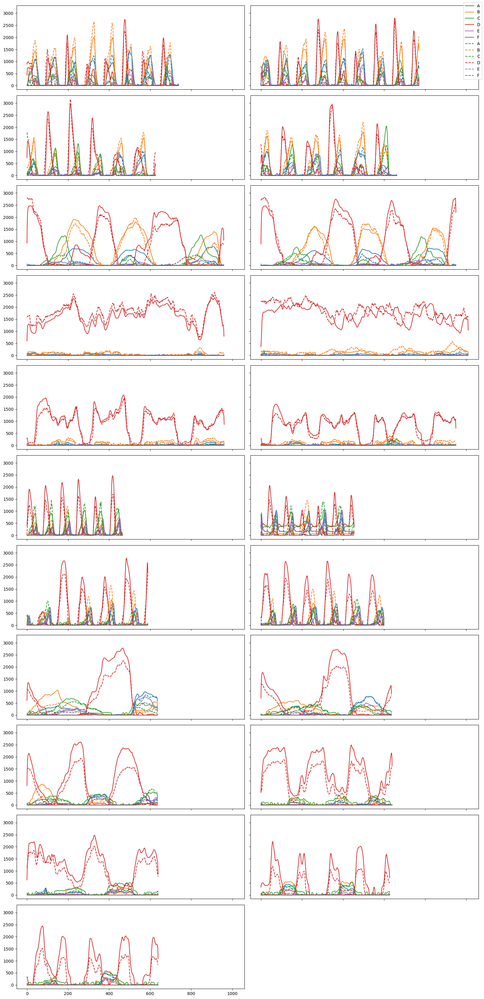

In [23]:
results = get_best_prediction(TASK4, 'metric', 'min')
for pred, y in results:
    pred[pred < EPS] = 0
    y[y < EPS] = 0
plot_list([(pred[:, :6], y[:, :6]) for pred, y in results], plot_force, axis_size=(8, 3), max_col=2)

### task5

Failed to read the results for 1 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-07-19_10-04-48/FSR_Trainable_2a147f32_9_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_subject,index_X=FSR_for_force,index__2023-07-19_10-08-30
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.jso

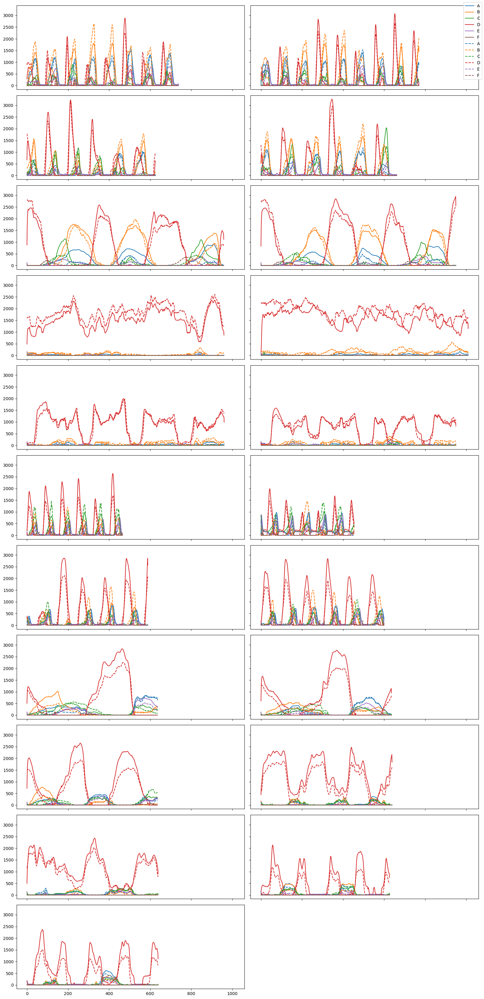

In [5]:
results = get_best_prediction(TASK5, 'rmse', 'min')
for pred, y in results:
    pred[pred < EPS] = 0
    y[y < EPS] = 0
plot_list([(pred, y) for pred, y in results], plot_force, axis_size=(8, 3), max_col=2)

# coord plot

### task1

Failed to read the results for 2 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_1a76a8a6_33_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-35-52
- /home/seokj/ray_results/FSR_Trainable_2023-08-10_18-18-32/FSR_Trainable_3d8c1dc7_11_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_time,imputer=sklearn_impute_SimpleI_2023-08-10_18-20-39
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated a

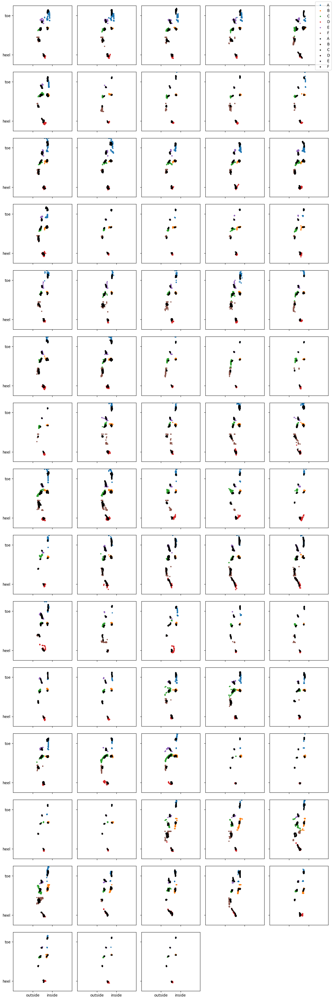

In [5]:
results = get_best_prediction(TASK1, 'metric', 'min')
plot_list([(pred[:, 6:], y[:, 6:]) for pred, y in results], plot_coord)

### task3

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

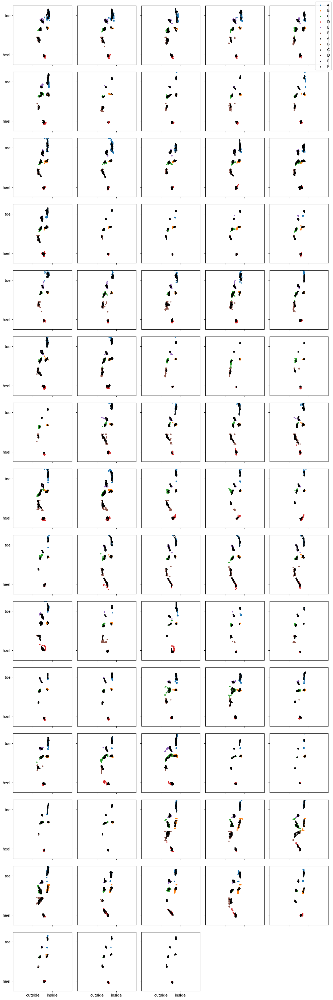

In [7]:
results = get_best_prediction(TASK3, 'rmse', 'min')
plot_list([(pred, y) for pred, y in results], plot_coord)

### task4

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

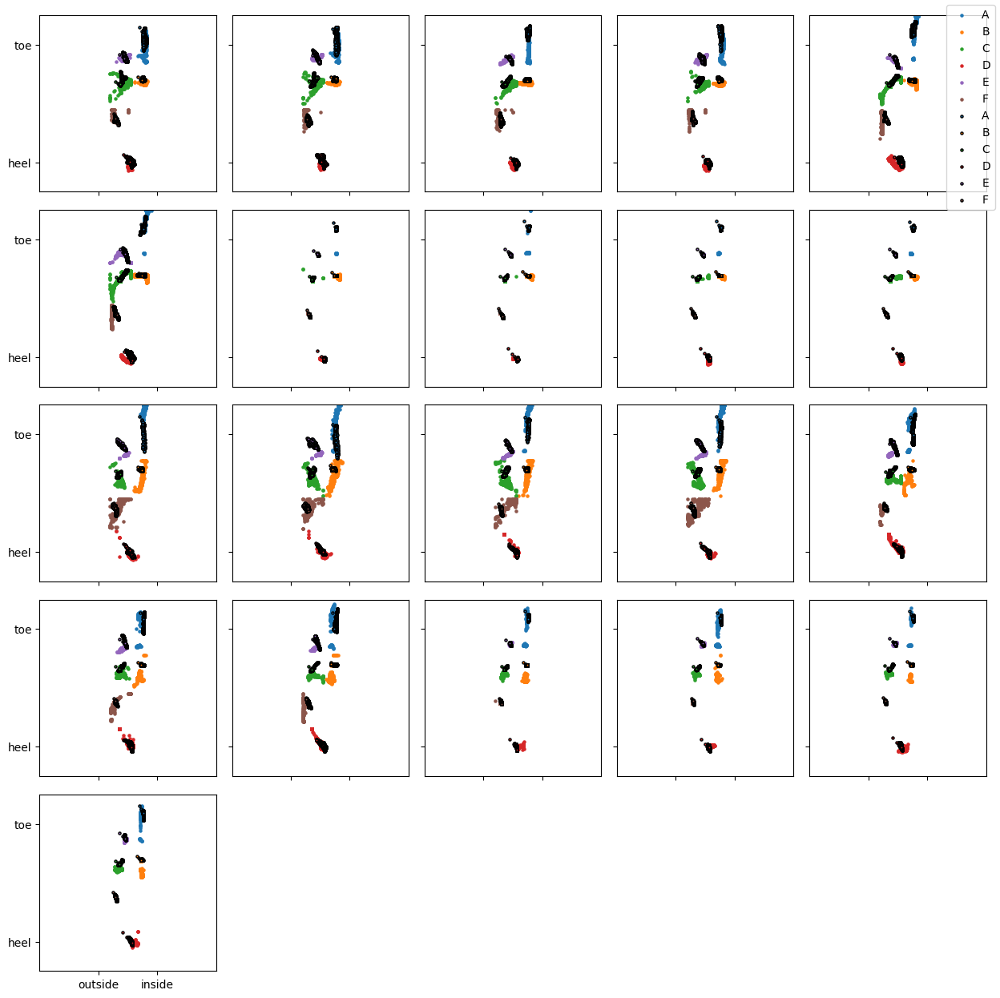

In [8]:
results = get_best_prediction(TASK4, 'rmse', 'min')
plot_list([(pred[:, 6:], y[:, 6:]) for pred, y in results], plot_coord)

### task6

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

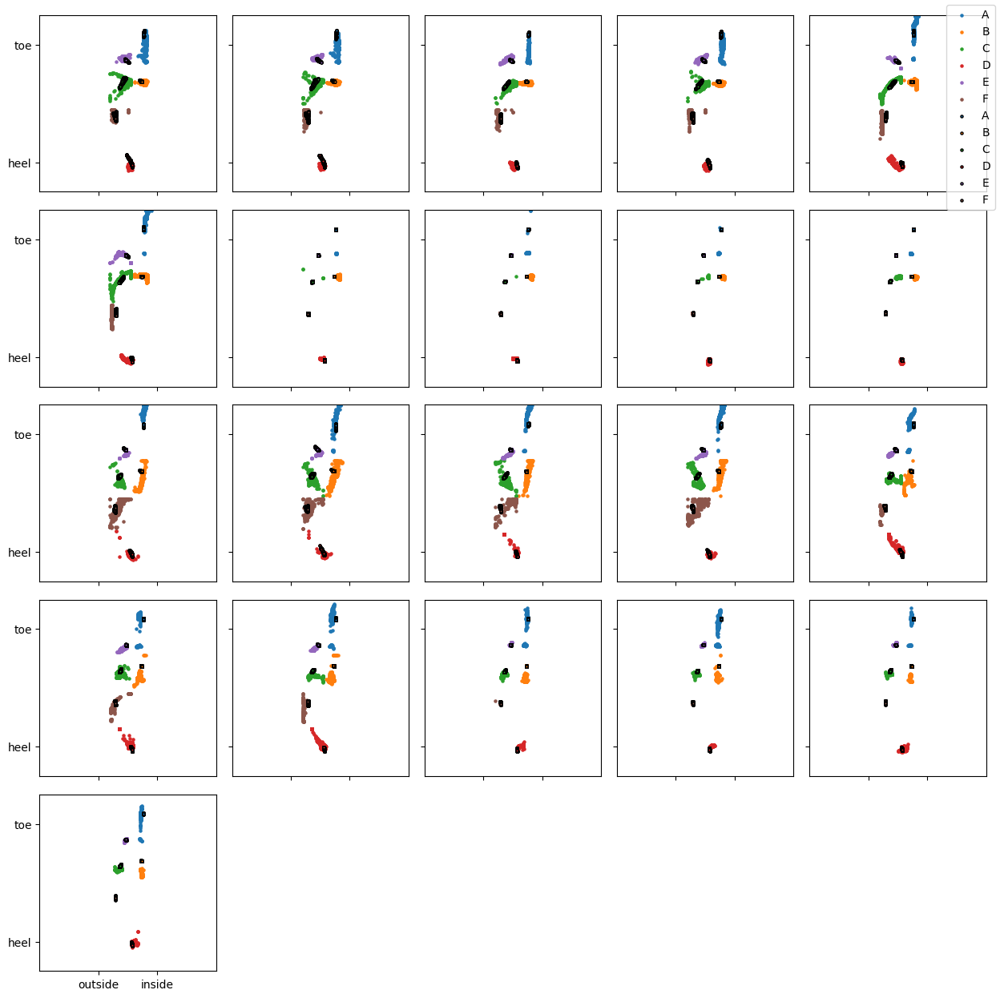

In [9]:
results = get_best_prediction(TASK6, 'rmse', 'min')
plot_list([(pred, y) for pred, y in results], plot_coord)

# cop plot

### task1

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

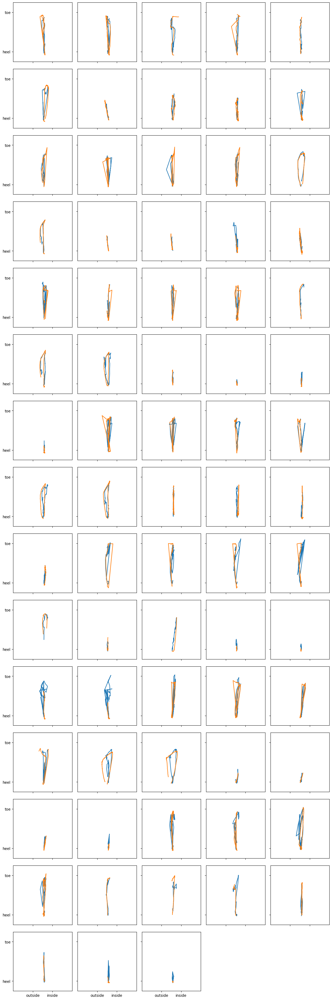

In [10]:
results = get_best_prediction(TASK1, 'rmse', 'min')
for pred, y in results:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
plot_list([(pred, y) for pred, y in results], plot_cop)

### task2 + task3

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

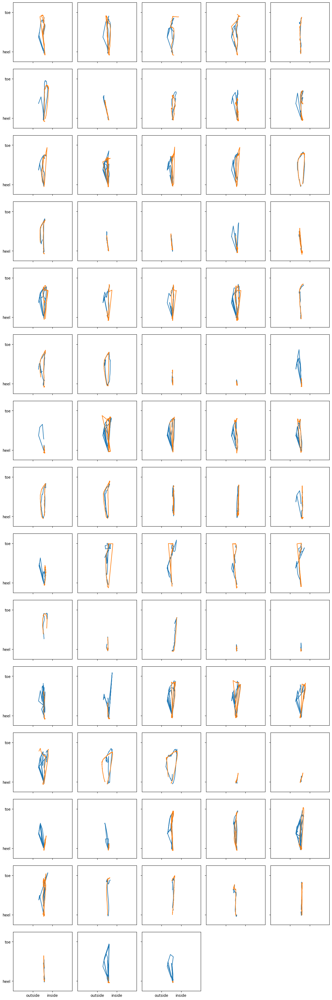

In [11]:
results1 = get_best_prediction(TASK2, 'rmse', 'min')
results2 = get_best_prediction(TASK3, 'rmse', 'min')
for pred, y in results1:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
for pred, y in results2:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
import numpy as np
plot_list([(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)], plot_cop)

### task4

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

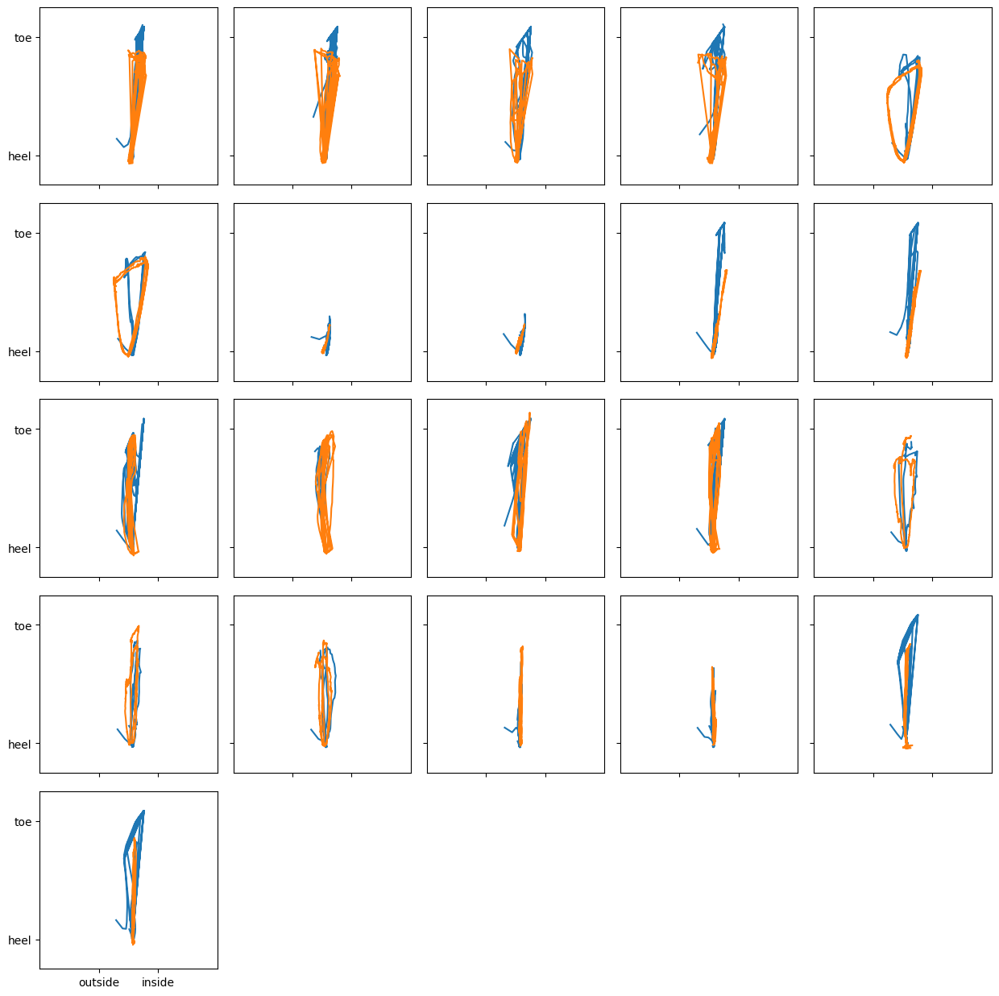

In [55]:
results = get_best_prediction('FSR_Trainable_2023-08-10_23-25-39', 'metric', 'min')
for pred, y in results:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
plot_list([(pred, y) for pred, y in results], plot_cop)

/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.json.JsonLoggerCallback` interface and will be removed in Ray 2.7.
  self._loggers.append(cls(self.config, self.logdir, self.trial))
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is

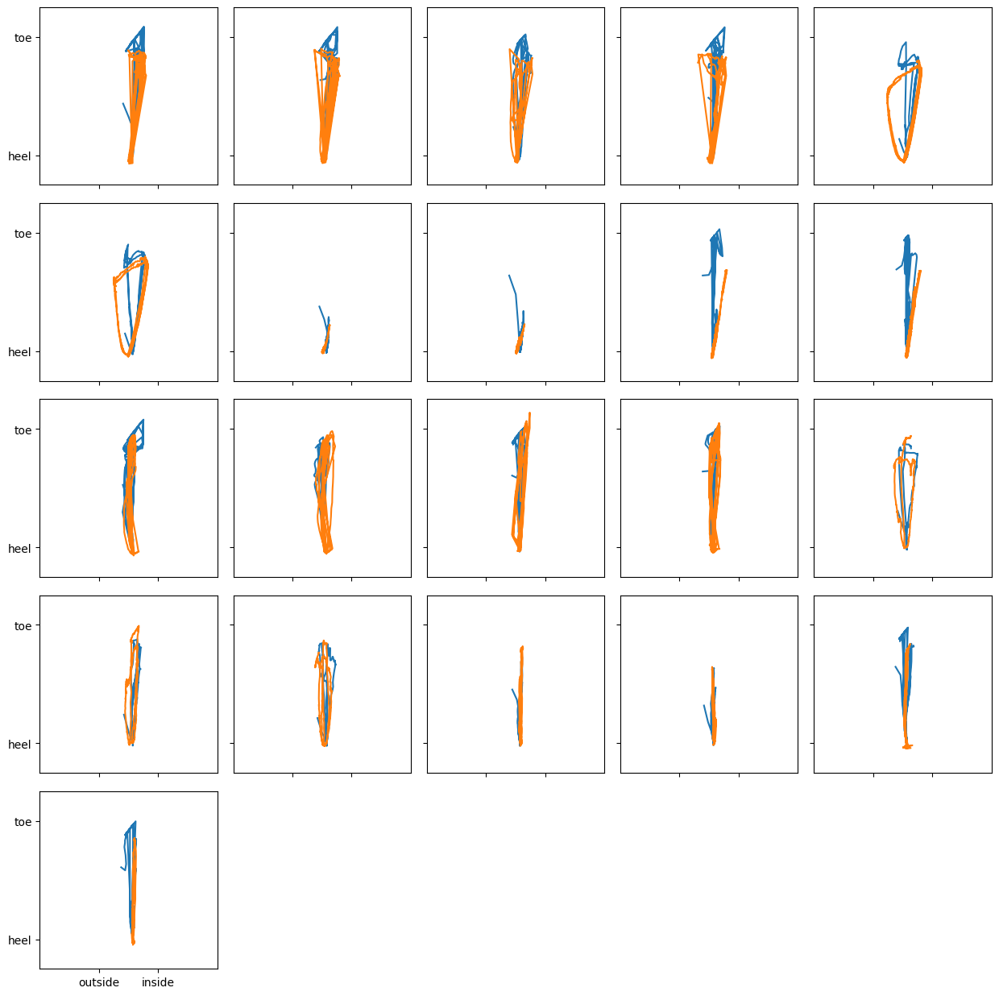

In [12]:
results = get_best_prediction(TASK4, 'rmse', 'min')
for pred, y in results:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
plot_list([(pred, y) for pred, y in results], plot_cop)

### task5 + task6

Failed to read the results for 1 trials:
- /home/seokj/ray_results/FSR_Trainable_2023-07-19_10-04-48/FSR_Trainable_2a147f32_9_criterion=torch_nn_MSELoss,data_loader=fsr_data_get_index_splited_by_subject,index_X=FSR_for_force,index__2023-07-19_10-08-30
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/trainable/trainable.py:1094: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
`UnifiedLogger` will be removed in Ray 2.7.
  self._result_logger = UnifiedLogger(config, self._logdir, loggers=None)
/home/seokj/workspace/.venv/lib/python3.10/site-packages/ray/tune/logger/unified.py:53: RayDeprecationWarning: This API is deprecated and may be removed in future Ray releases. You could suppress this warning by setting env variable PYTHONWARNINGS="ignore::DeprecationWarning"
The `JsonLogger interface is deprecated in favor of the `ray.tune.jso

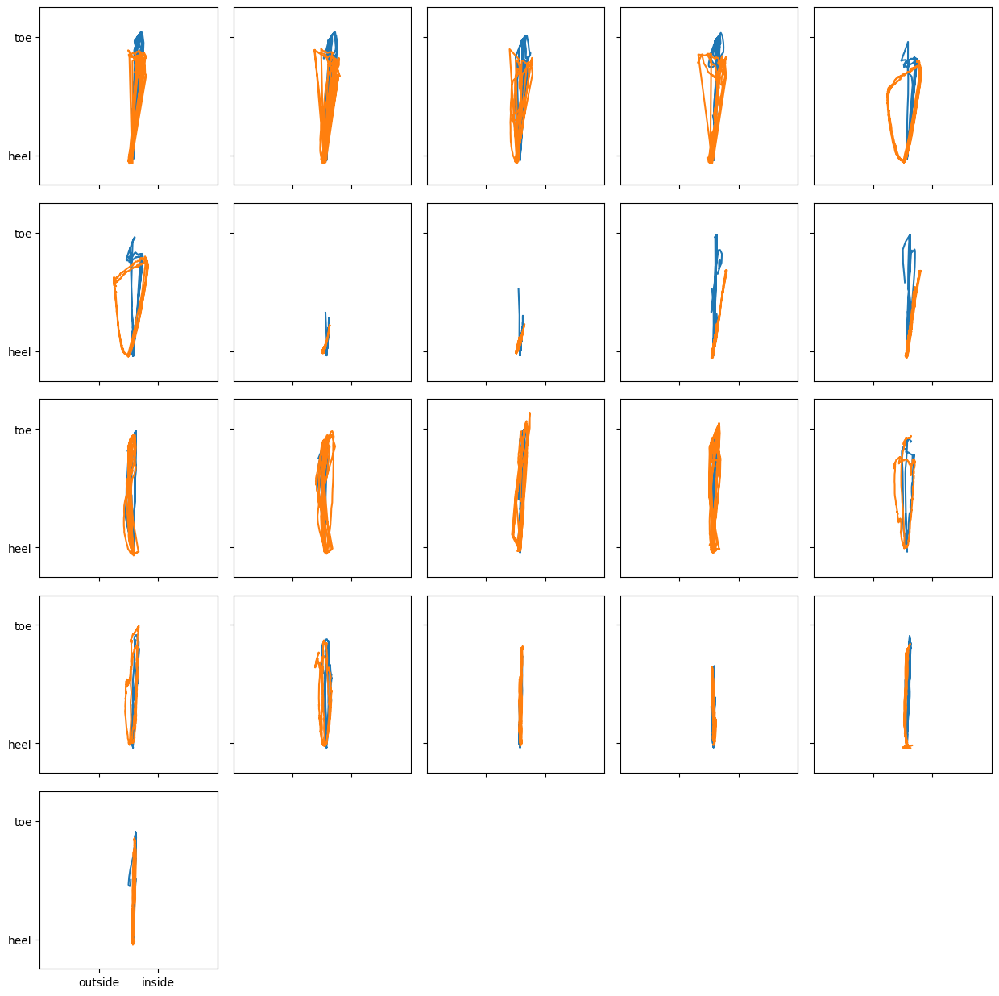

In [13]:
results1 = get_best_prediction(TASK5, 'rmse', 'min')
results2 = get_best_prediction(TASK6, 'rmse', 'min')
for pred, y in results1:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
for pred, y in results2:
    pred[:, :6][pred[:, :6] < EPS] = 0
    y[:, :6][y[:, :6] < EPS] = 0
import numpy as np
plot_list([(np.hstack([pred1, pred2]), np.hstack([y1, y2])) for (pred1, y1), (pred2, y2) in zip(results1, results2)], plot_cop)